In [1]:
import sys
sys.path.append('..')
sys.path.append('../stylegan3')

from stylegan_generator import StyleGANGenerator

import pickle
import h5py

import numpy as np
import matplotlib.pyplot as plt

In [2]:
_f = 'Male'
_attributes = [_f]
_all_features = ['Attractive', 'Eyeglasses', 'No_Beard', 'Male', 'Black_Hair', 'Blond_Hair', 'Mustache', 'Young', 'Smiling', 'Bald']
_noise_path_no_feature = '/home/robert/data/diploma-thesis/datasets/features/z/' + _f.lower() + '/0.h5'
_noise_path_feature = '/home/robert/data/diploma-thesis/datasets/features/z/' + _f.lower() + '/1/1_5.h5'
_predictions_path = '/home/robert/data/diploma-thesis/datasets/features/predictions/' + _f.lower() + '/resnet34_10attr.pkl'

network_pkl = 'https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhqu-1024x1024.pkl'
# network_pkl = 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl'
generator = StyleGANGenerator(network_pkl)

In [3]:
with open(_predictions_path, 'rb') as f:
    predictions = pickle.load(f)[:,_all_features.index(_f)]
    
with h5py.File(_noise_path_feature, 'r') as f:
    z = f['z'][:]
    
with h5py.File(_noise_path_no_feature, 'r') as f:
    z_no_feature = f['z'][:]
    
print(predictions.shape, z.shape, z_no_feature.shape)

(91852,) (91852, 512) (91852, 512)


Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.


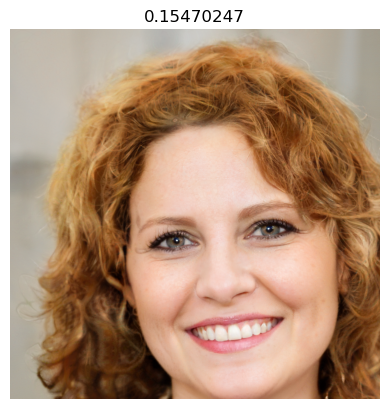

In [4]:
image_n = 12
img = generator.generate_from(np.reshape(z[image_n], (1,512)), truncation_psi=0.7)
plt.title(predictions[image_n])
plt.axis('off')
plt.imshow(img[0]/255)

In [5]:
feature_idx = np.where(predictions > 0.5)[0]
feature_z = z[feature_idx]
feature_predictions = predictions[feature_idx]

In [6]:
no_feature_z = z_no_feature[feature_idx]
no_feature_z.shape, feature_z.shape

((78405, 512), (78405, 512))

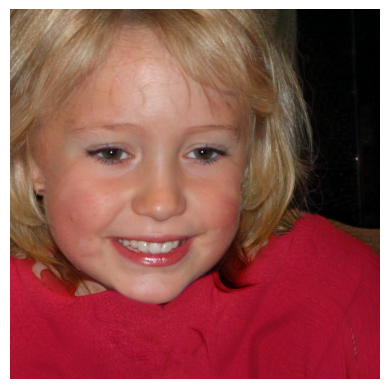

In [7]:
image_n = 0
img = generator.generate_from(np.reshape(no_feature_z[image_n], (1,512)), truncation_psi=0.7)
plt.axis('off')
plt.imshow(img[0]/255)

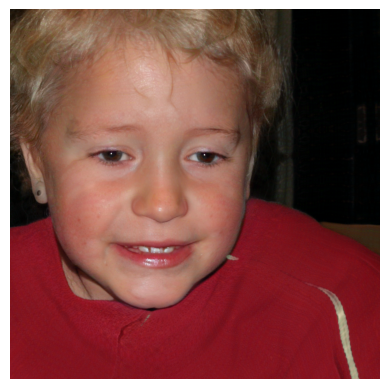

In [8]:
img = generator.generate_from(np.reshape(feature_z[image_n], (1,512)), truncation_psi=0.7)
plt.axis('off')
plt.imshow(img[0]/255)

In [9]:
idx = np.random.randint(no_feature_z.shape[0], size=10)
imgs1 = generator.generate_from(no_feature_z[idx], truncation_psi=0.7)
imgs2 = generator.generate_from(feature_z[idx], truncation_psi=0.7)

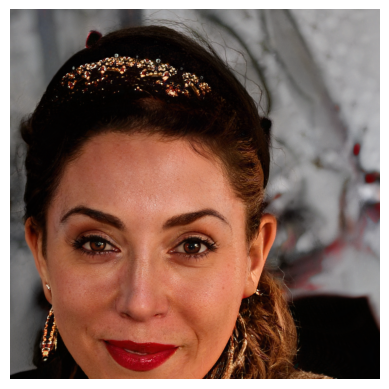

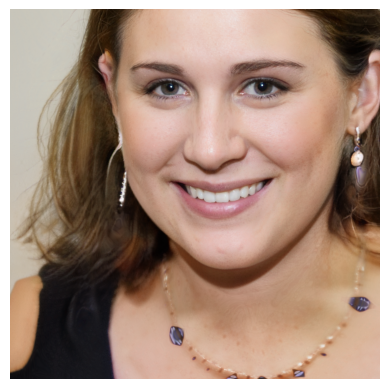

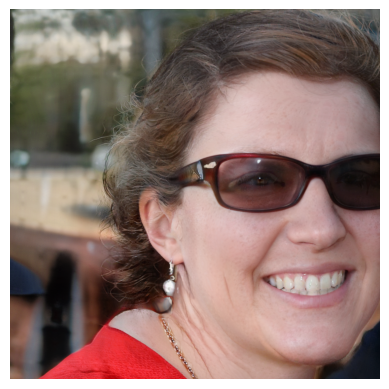

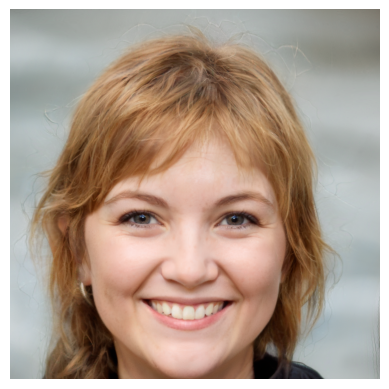

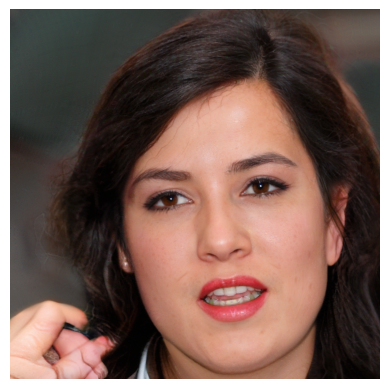

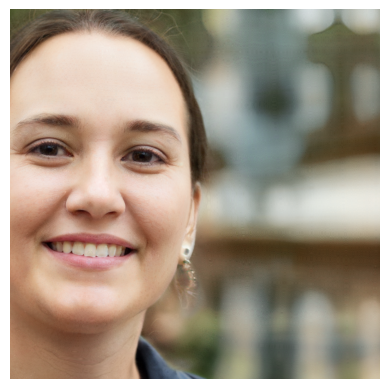

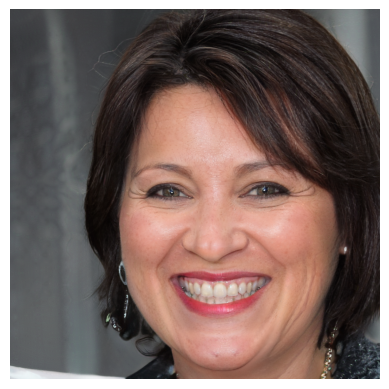

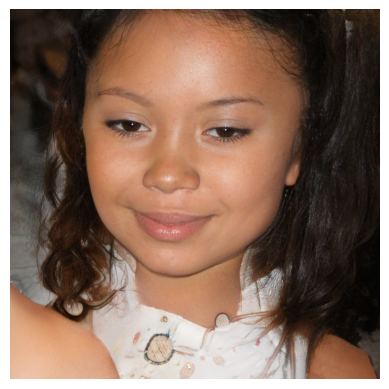

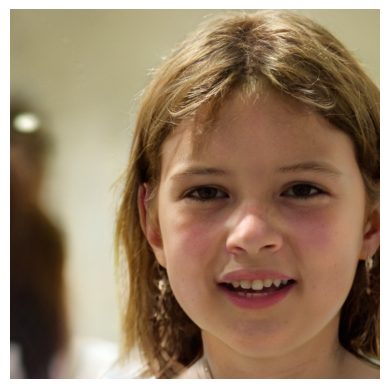

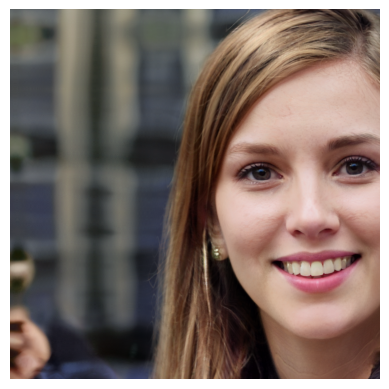

In [10]:
for img in imgs1:
    plt.axis("off")
    plt.imshow(img/255)
    plt.show()

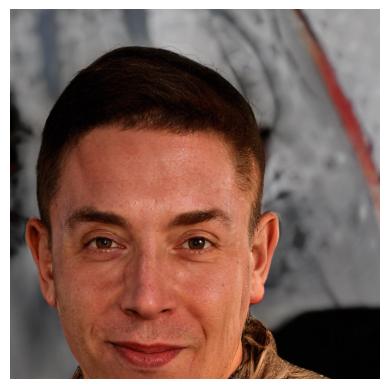

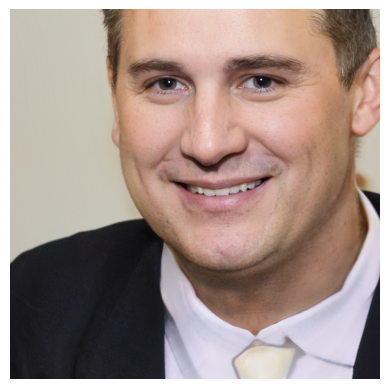

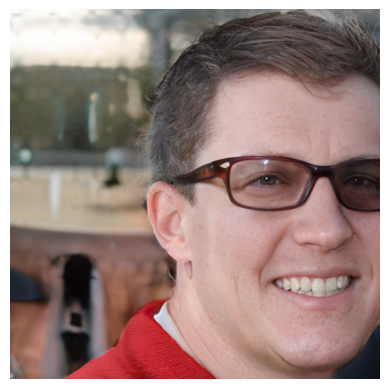

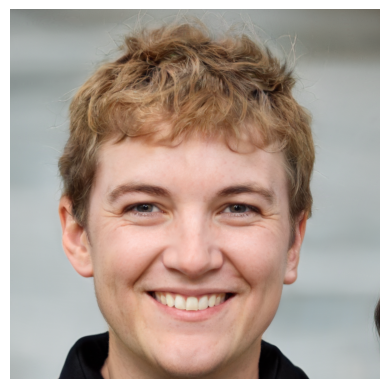

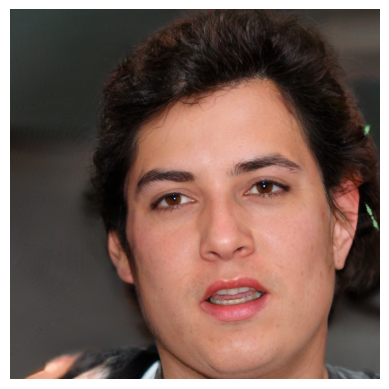

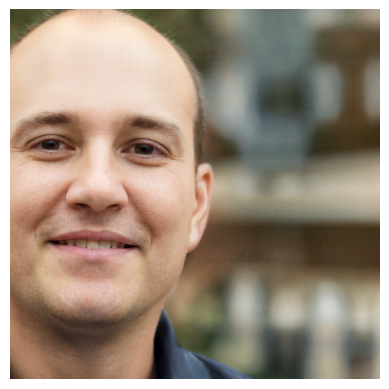

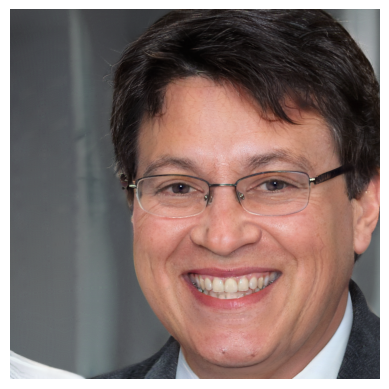

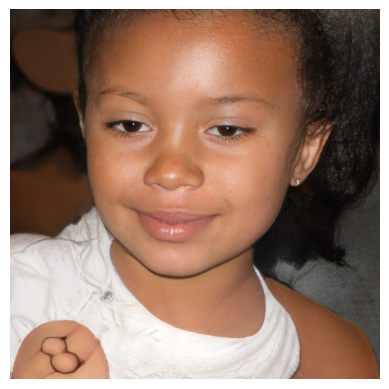

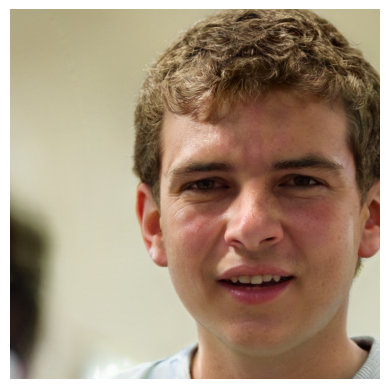

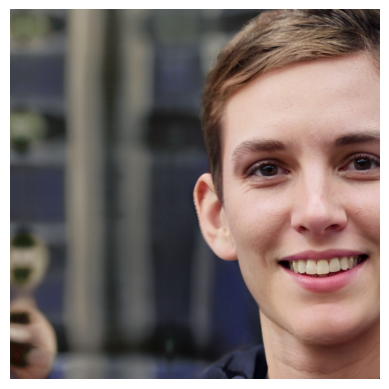

In [11]:
for img in imgs2:
    plt.axis("off")
    plt.imshow(img/255)
    plt.show()

In [12]:
no_feature_z.shape, feature_z.shape

((78405, 512), (78405, 512))

In [13]:
dataset = None
for i in range(len(_attributes)):
    true_labels = np.zeros((len(feature_z), len(_attributes)))
    true_labels[:,i] = 1
    false_labels = np.zeros((len(no_feature_z), len(_attributes)))
    
    dataset = np.array(list(zip(no_feature_z, true_labels, feature_z)), dtype=object)
    dataset = np.vstack((dataset, np.array(list(zip(no_feature_z, false_labels, no_feature_z)), dtype=object)))
    dataset = np.vstack((dataset, np.array(list(zip(feature_z, true_labels, feature_z)), dtype=object)))
    dataset = np.vstack((dataset, np.array(list(zip(feature_z, false_labels, feature_z)), dtype=object)))

In [14]:
len(dataset)

313620

In [15]:
with open('/home/robert/data/diploma-thesis/datasets/features/' + _f.lower().replace(' ', '_') + '_dataset.pkl', 'wb') as f:
    pickle.dump(dataset, f)

In [16]:
with open('/home/robert/data/diploma-thesis/datasets/features/' + _f.lower().replace(' ', '_') + '_dataset.pkl', 'rb') as f:
    data = pickle.load(f)

In [17]:
size = no_feature_z.shape[0]
idx = np.random.randint(size, size=3)
imgs1 = generator.generate_from(np.stack(data[idx, 0]), truncation_psi=0.7)
imgs2 = generator.generate_from(np.stack(data[idx+size, 0]), truncation_psi=0.7)
imgs3 = generator.generate_from(np.stack(data[idx+2*size, 0]), truncation_psi=0.7)
imgs4 = generator.generate_from(np.stack(data[idx+3*size, 0]), truncation_psi=0.7)

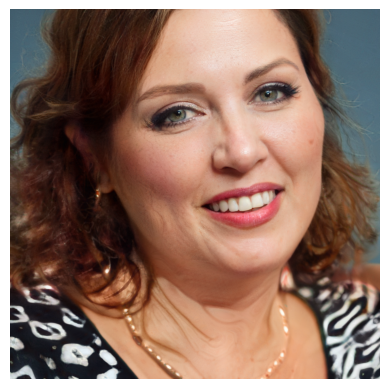

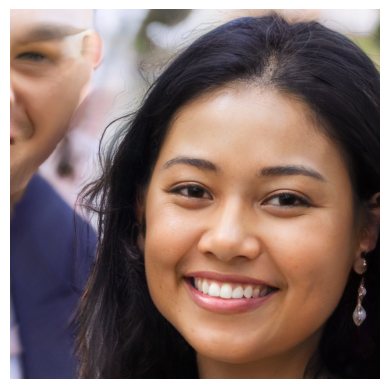

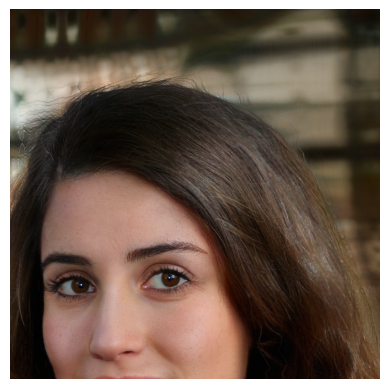

In [18]:
for img in imgs1:
    plt.axis("off")
    plt.imshow(img/255)
    plt.show()

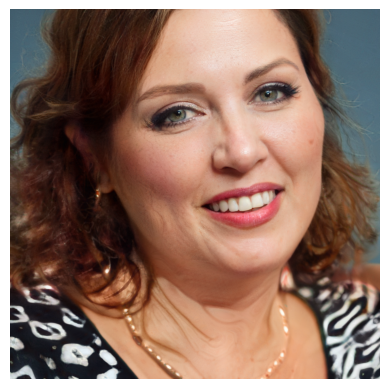

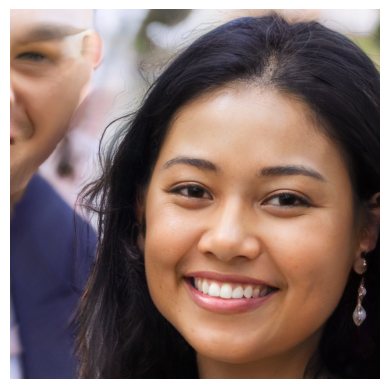

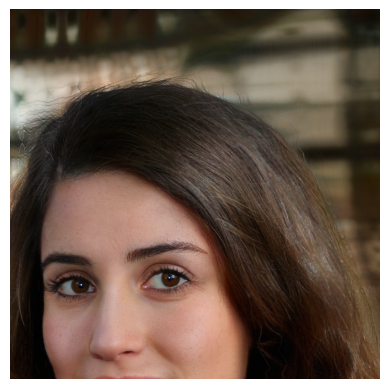

In [19]:
for img in imgs2:
    plt.axis("off")
    plt.imshow(img/255)
    plt.show()

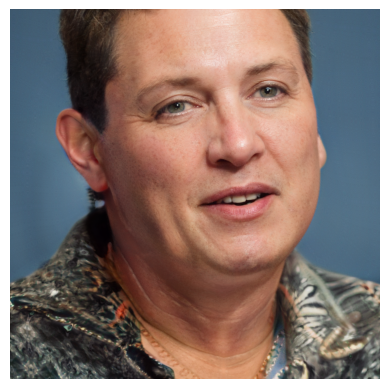

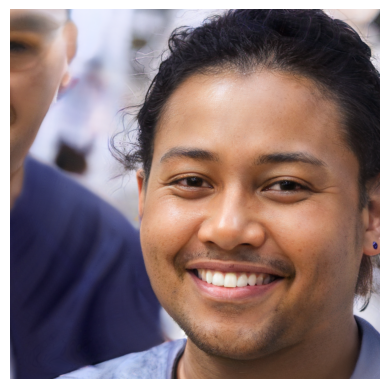

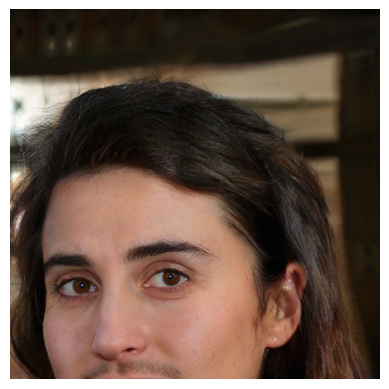

In [20]:
for img in imgs3:
    plt.axis("off")
    plt.imshow(img/255)
    plt.show()

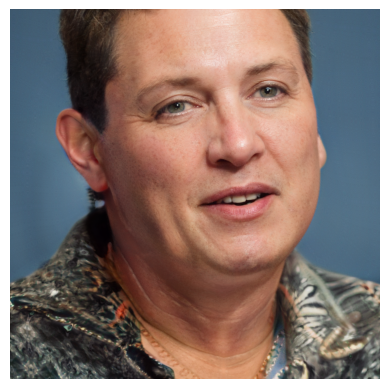

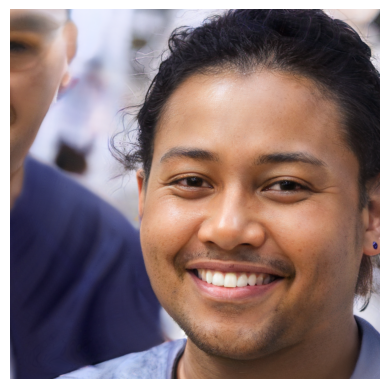

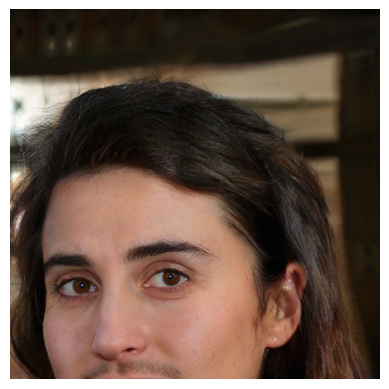

In [21]:
for img in imgs4:
    plt.axis("off")
    plt.imshow(img/255)
    plt.show()

In [6]:
features = ['Eyeglasses', 'Male', 'Black_Hair']

for f in features:
    with open('/home/robert/data/diploma-thesis/datasets/features/' + f.lower().replace(' ', '_') + '_dataset.pkl', 'rb') as f:
        data = pickle.load(f)
        size = len(data)
        print(size, size/4)

371980 92995.0
313620 78405.0
329888 82472.0


In [5]:
313620 // 4

78405